# Damage Size Regression on Synthetic Data
In this notebook, we conduct experiments for damage size regression. 

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/berni-lehner/structural_health_monitoring/blob/main/notebooks/synthetic_regression_AB.ipynb)

In [1]:
%load_ext rich
%load_ext autoreload
%autoreload 2
%matplotlib inline

from rich import print

random_state = 42

## Prerequisites

In [2]:
import sys
import os
from pathlib import Path
import pandas as pd

# initialize environment, paths, etc...
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB:
    # uncomment in case you want to start from scratch in Colab
    !rm -rf /content/structural_health_monitoring  
    !git clone https://github.com/berni-lehner/structural_health_monitoring.git
    % pip install -r /content/structural_health_monitoring/requirements.txt

    # this is Colab specific, and only a manual "Run all" will cause the
    # installation to be finished
    if pd.__version__ != "1.4.2":
        print("Stopping RUNTIME! Please run again to finish installation.")
        os.kill(os.getpid(), 9)

    DATA_PATH = Path(r"/content/structural_health_monitoring/data")
    sys.path.insert(0, "/content/structural_health_monitoring/src")
else:
    DATA_PATH = Path(r"../data/")
    sys.path.insert(0, "../src")


sys.path.insert(0, DATA_PATH)
SYN_DATA_PATH = Path(DATA_PATH, "synthetic")
REAL_DATA_PATH = Path(DATA_PATH, "real_world")
RESULT_PATH = Path(DATA_PATH, "results")
if not os.path.isdir(RESULT_PATH):
    os.makedirs(RESULT_PATH)

try:
    from zippeekiyay import namelist
except ImportError or ModuleNotFoundError:
    print("installing zippee-ki-yay...")
    % pip install git+https://github.com/berni-lehner/zippee-ki-yay.git

    from zippeekiyay import namelist

CALIBRATION_FILE = Path(REAL_DATA_PATH, "calibration.pkl")

In [3]:
# Intel(R) Extension for Scikit-learn for speed-up
from sklearnex import patch_sklearn

patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [4]:
import time
import glob
import sklearn
import numpy as np
from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets

# ...and download raw data if not already downloaded
from data_utils import init_data

# init_data(syn_data_path=SYN_DATA_PATH)

from plot_utils import (
    init_plotting,
    plot_metrics,
    plot_cv_indices,
    plot_embedding_targets,
    init_plotting,
    plot_classwise_dist,
    plot_classwise_kde,
)

# configure fonts, etc...
init_plotting()

from scoring_utils import get_synth_regression_scoring, SHM_Scoring
from cv_utils import (
    AnomalyShuffleSplit,
    RepeatedAnomalyShuffleSplit,
    CreateAnomalyData,
    dump_cv,
)
from bench_utils import classification_benchmark, repeat_experiment, extract_metrics
from data_utils import load_processed_data, load_syn_reg_data, FEATURE_LIST
from shm_experiments import conduct_ab_reg_experiment

In [5]:
result_file = "s30_synthetic_regression_AB_featsel.pkl"
result_file = Path(RESULT_PATH, result_file)

## Data Loading

In [6]:
X, y = load_syn_reg_data(data_path=SYN_DATA_PATH, min_radius=1.9, cache=True)

In [7]:
X.shape

(28302, 31)

In [8]:
cnt = Counter(y)
cnt


Counter({
    0.0: 990,
    2.2: 979,
    2.5: 979,
    2.8: 978,
    3.1: 986,
    3.4: 972,
    3.8: 973,
    4.1: 976,
    4.4: 979,
    4.7: 976,
    5.0: 977,
    6.7: 981,
    8.3: 972,
    10.0: 973,
    12.0: 969,
    14.0: 978,
    16.0: 980,
    18.0: 976,
    20.0: 974,
    22.0: 975,
    24.0: 980,
    26.0: 973,
    28.0: 983,
    30.0: 977,
    32.0: 967,
    34.0: 971,
    36.0: 976,
    38.0: 964,
    40.0: 968
})

## Feature selection

In [9]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.feature_selection import (
    SelectKBest,
    f_regression,
    r_regression,
    mutual_info_regression,
)

from sklearn.preprocessing import FunctionTransformer
from imblearn.under_sampling import ClusterCentroids
from imblearn.pipeline import Pipeline

from pipe_utils import build_pipeline, build_sampled_pipeline

In [10]:
samples_per_class = 40
classes, counts = np.unique(y, return_counts=True)
n_classes = len(classes)
strgy = dict(zip(range(n_classes), [samples_per_class] * n_classes))

sampler = ClusterCentroids(
    estimator=KMeans(n_init="auto"),
    sampling_strategy=strgy,
    random_state=random_state,
)

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"Base KNN", build_pipeline())],
    [(f"Base Sampled", build_sampled_pipeline(sampler, estimator))],
]
for scorer in [f_regression, r_regression, mutual_info_regression]:
    for k in [15, 20, 25]:
        estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)
        fs = SelectKBest(score_func=scorer, k=k)

        pipeline = Pipeline([("featsel", fs), ("estimator", estimator)], verbose=False)
        models.append([(f"{scorer.__name__}_{k}", pipeline)])

In [11]:
scoring = get_synth_regression_scoring()

results = conduct_ab_reg_experiment(
    X=X,
    y=y,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)

## Store results for later

In [12]:
results.to_pickle(result_file)

## Plot some results for overview

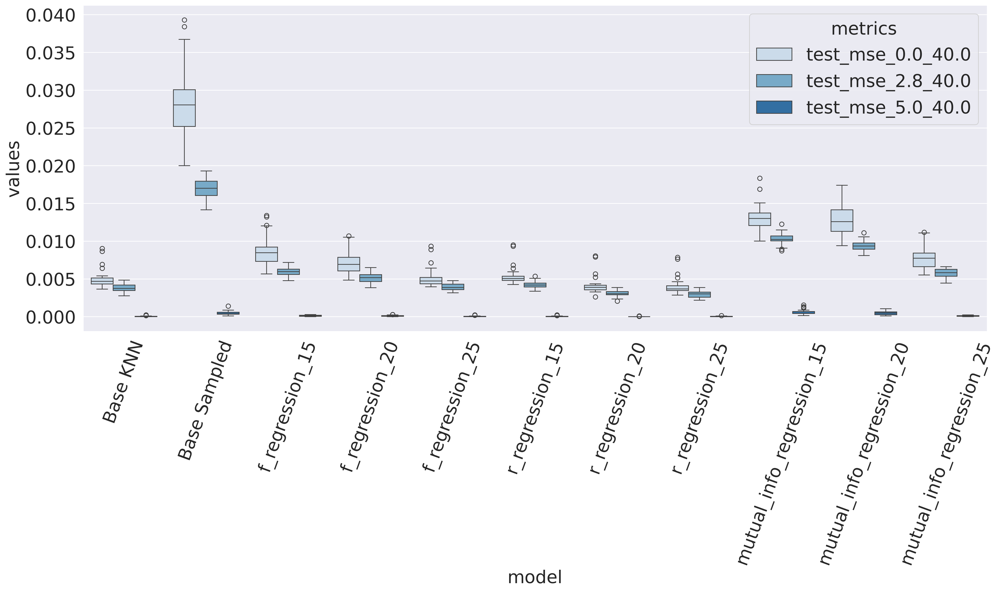

In [13]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.8_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()

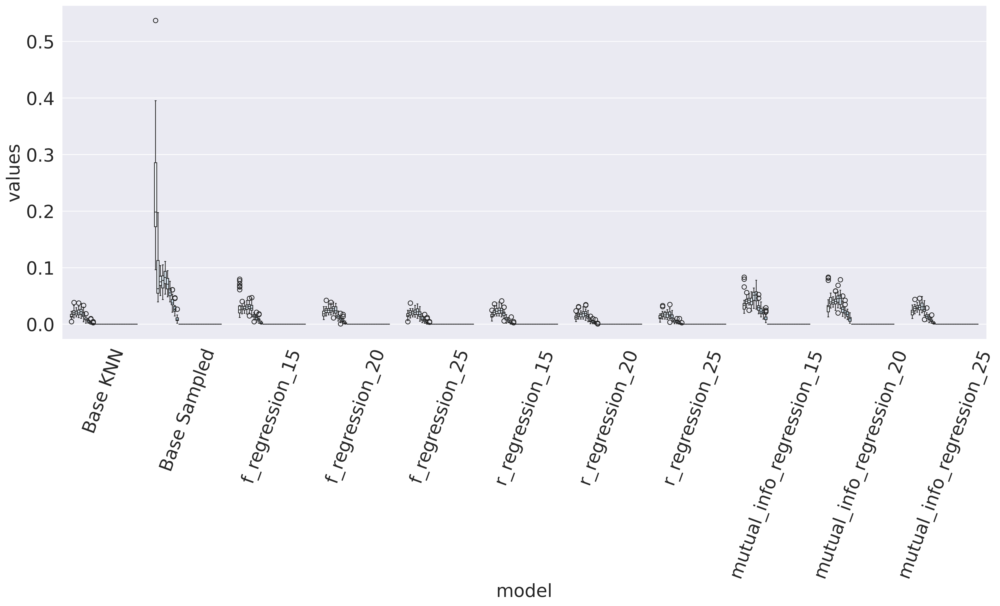

In [14]:
shm_scoring = SHM_Scoring()

fig = plot_metrics(extract_metrics(results, shm_scoring.SYNTH_MSE_RESULTS))
plt.gca().get_legend().remove()

plt.xticks(rotation=70)
plt.show()

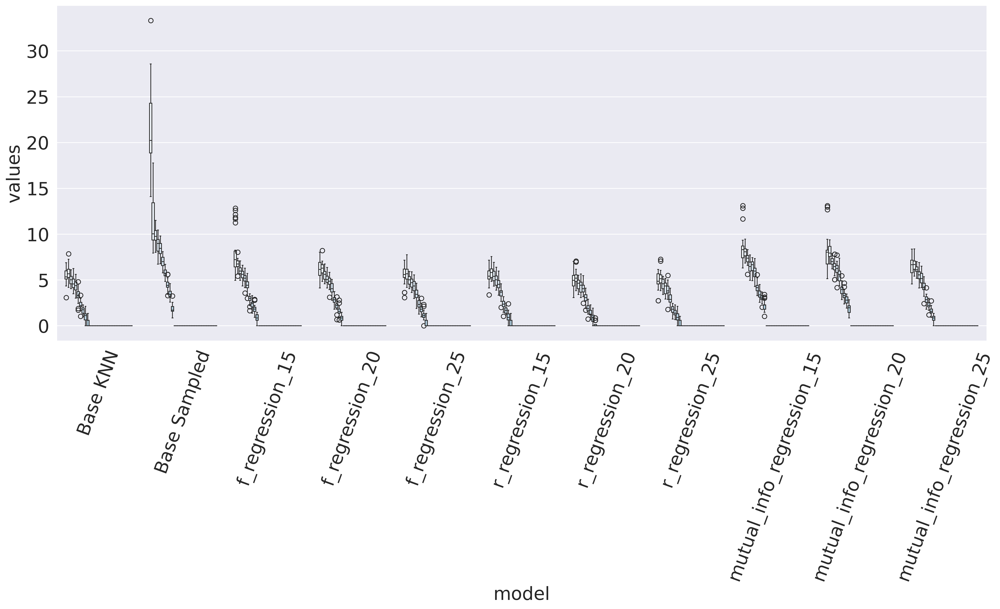

In [15]:
fig = plot_metrics(extract_metrics(results, shm_scoring.SYNTH_REL_ERROR))
plt.gca().get_legend().remove()

plt.xticks(rotation=70)
plt.show()

In [16]:
results[["model", "fit_time", "score_time"]].groupby(by="model").mean()

,fit_time,score_time
model,,
Base KNN,0.014457,0.068661
Base Sampled,0.175898,0.034782
f_regression_15,0.042044,0.056610
f_regression_20,0.020897,0.063344
f_regression_25,0.021516,0.062156
mutual_info_regression_15,3.229484,0.033065
mutual_info_regression_20,3.123241,0.037831
mutual_info_regression_25,3.150421,0.037234
r_regression_15,0.042778,0.054730


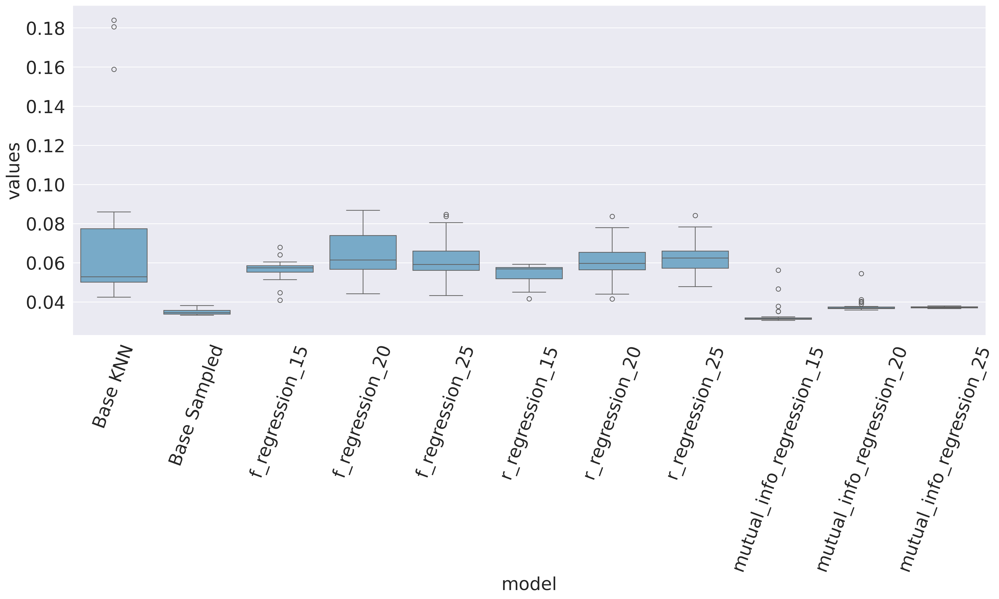

In [17]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()

plt.xticks(rotation=70)
plt.show()

In [18]:
from sklearn.preprocessing import OrdinalEncoder
from imblearn.base import FunctionSampler


def _resampling(X, y=None, sampler=lambda *_: _, **_):
    enc = OrdinalEncoder(dtype=np.int32)

    y_cls = enc.fit_transform(y.reshape(-1, 1))
    x_re, y_recls = sampler.fit_resample(X, y_cls)
    y_re = enc.inverse_transform(y_recls.reshape(-1, 1))

    return x_re, y_re.squeeze()


samples_per_class = 40
classes, counts = np.unique(y, return_counts=True)
n_classes = len(classes)
strgy = dict(zip(range(n_classes), [samples_per_class] * n_classes))

sampler = ClusterCentroids(
    estimator=KMeans(n_init="auto"),
    sampling_strategy=strgy,
    random_state=random_state,
)

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"Base KNN", build_pipeline())],
    [(f"Base Sampled", build_sampled_pipeline(sampler, estimator))],
]
for scorer in [f_regression, r_regression, mutual_info_regression]:
    for k in [15, 20, 25]:
        fs = SelectKBest(score_func=scorer, k=k)

        sampler = ClusterCentroids(
            estimator=KMeans(n_init="auto"),
            sampling_strategy=strgy,
            random_state=random_state,
        )

        estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

        pipeline = Pipeline(
            [
                ("featsel", fs),
                (
                    "sampler",
                    FunctionSampler(
                        func=_resampling, kw_args=dict(sampler=sampler), validate=False
                    ),
                ),
                ("estimator", estimator),
            ],
            verbose=False,
        )
        models.append([(f"{scorer.__name__}_{k}", pipeline)])
scoring = get_synth_regression_scoring()

In [19]:
results = conduct_ab_reg_experiment(
    X=X,
    y=y,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)

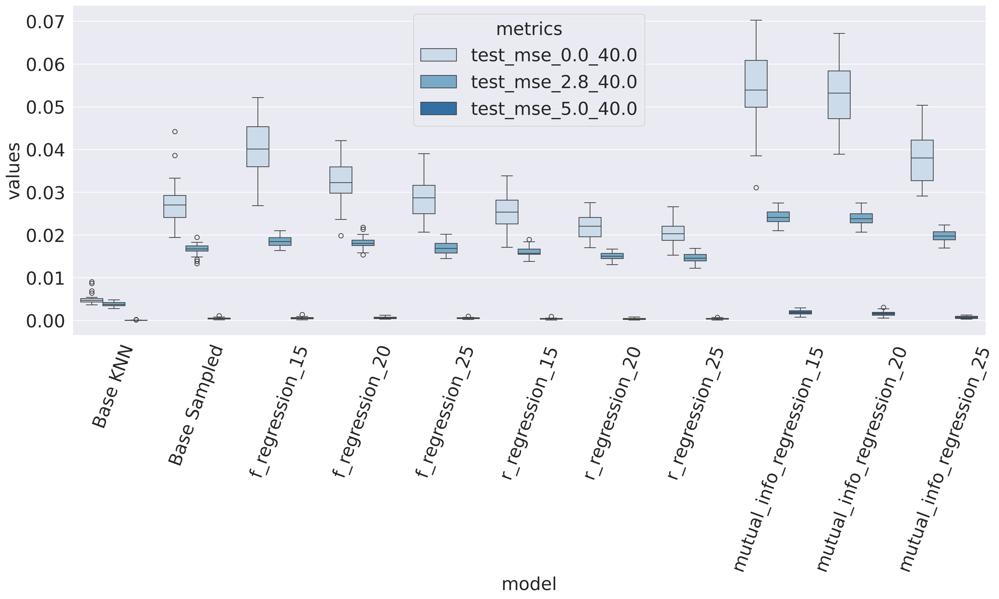

In [20]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.8_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()

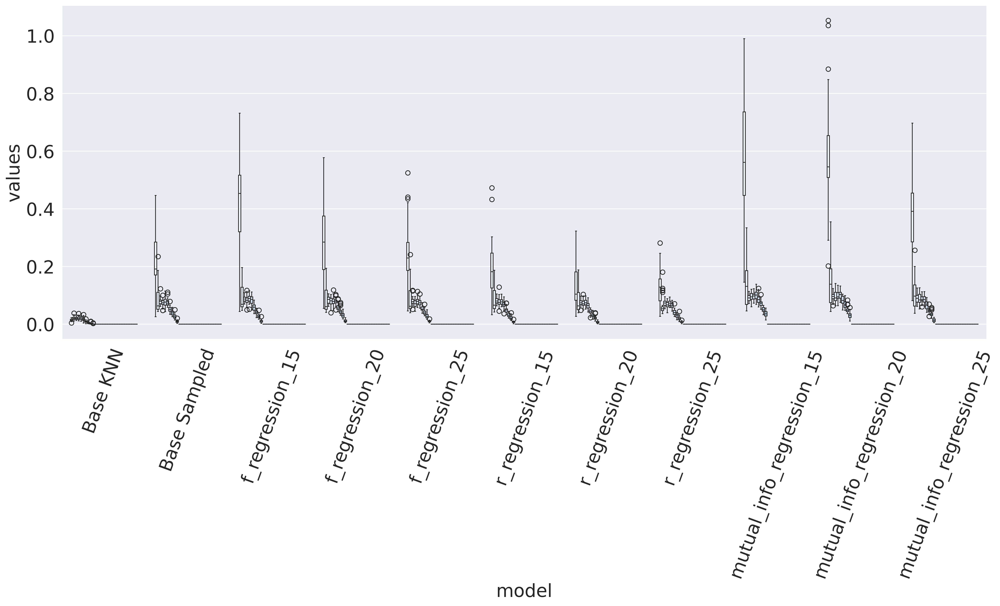

In [21]:
shm_scoring = SHM_Scoring()

fig = plot_metrics(extract_metrics(results, shm_scoring.SYNTH_MSE_RESULTS))
plt.gca().get_legend().remove()

plt.xticks(rotation=70)
plt.show()

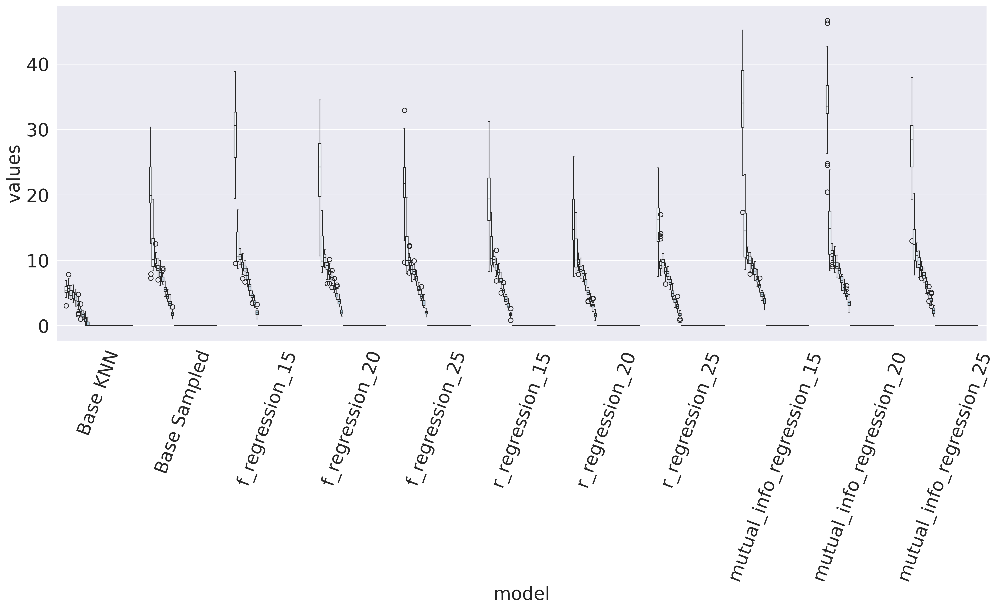

In [22]:
fig = plot_metrics(extract_metrics(results, shm_scoring.SYNTH_REL_ERROR))
plt.gca().get_legend().remove()

plt.xticks(rotation=70)
plt.show()

In [23]:
results[["model", "fit_time", "score_time"]].groupby(by="model").mean()

,fit_time,score_time
model,,
Base KNN,0.006736,0.053582
Base Sampled,0.144026,0.036915
f_regression_15,0.162557,0.044527
f_regression_20,0.169155,0.040359
f_regression_25,0.172290,0.040445
mutual_info_regression_15,3.382859,0.031636
mutual_info_regression_20,3.314985,0.029121
mutual_info_regression_25,3.347316,0.028214
r_regression_15,0.152433,0.042837


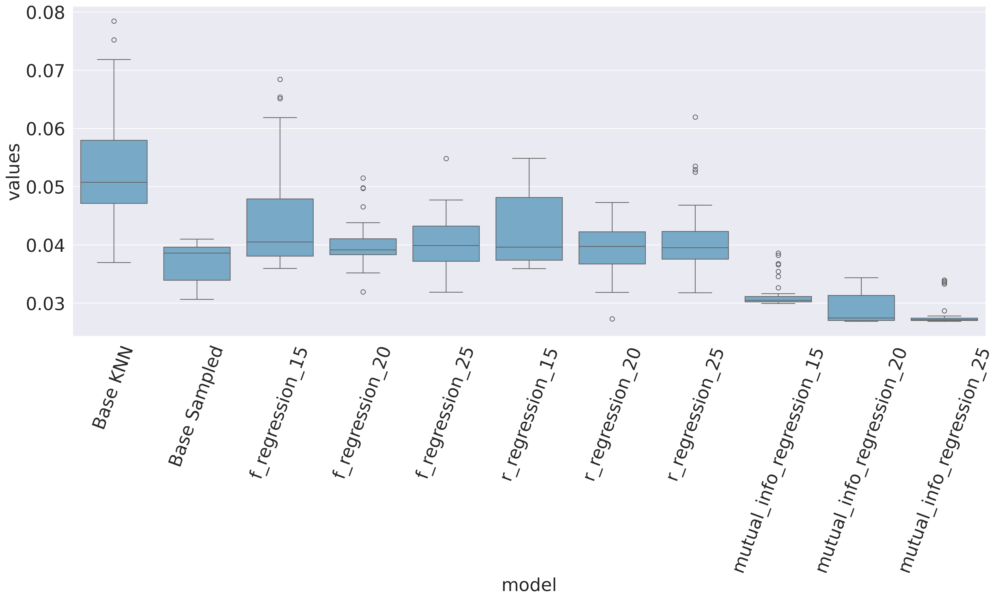

In [24]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()

plt.xticks(rotation=70)
plt.show()

# Feature Selection + ClusterCentroids

In [25]:
result_file = "s30_synthetic_regression_AB_featsel_cc.pkl"
result_file = Path(RESULT_PATH, result_file)

In [26]:
from sklearn.preprocessing import OrdinalEncoder
from imblearn.base import FunctionSampler
from pipe_utils import resampling

classes, counts = np.unique(y, return_counts=True)
n_classes = len(classes)
strgy = dict(zip(range(n_classes), [samples_per_class] * n_classes))

sampler = ClusterCentroids(
    estimator=KMeans(n_init="auto"),
    sampling_strategy=strgy,
    random_state=random_state,
)

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"BASE", build_pipeline())],
    [(f"ClusterCentroids", build_sampled_pipeline(sampler, estimator))],
]

m_reg = ("Mutual_information", mutual_info_regression, [4, 5, 6])
f_reg = ("F-statistic", f_regression, [10, 11, 12])
r_reg = ("Pearson's_r-value", r_regression, [25, 26, 27])

for name, scorer, npt in [
    m_reg,
    f_reg,
    r_reg,
]:
    for k in npt:
        fs = SelectKBest(score_func=scorer, k=k)

        sampler = ClusterCentroids(
            estimator=KMeans(n_init="auto"),
            sampling_strategy=strgy,
            random_state=random_state,
        )

        estimator = KNeighborsRegressor(n_neighbors=1)

        pipeline = Pipeline(
            [
                ("featsel", fs),
                (
                    "sampler",
                    FunctionSampler(
                        func=resampling, kw_args=dict(sampler=sampler), validate=False
                    ),
                ),
                ("estimator", estimator),
            ],
            verbose=False,
        )
        models.append([(f"{name}_{k}-best", pipeline)])

In [27]:
scoring = get_synth_regression_scoring()

start_time = time.perf_counter()
results = conduct_ab_reg_experiment(
    X=X,
    y=y,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)
end_time = time.perf_counter()
print(f"time passed: {end_time-start_time:.2f} s")

time passed: 128.36 s

## Store results for later

In [28]:
results.to_pickle(result_file)

## Plot some results for overview

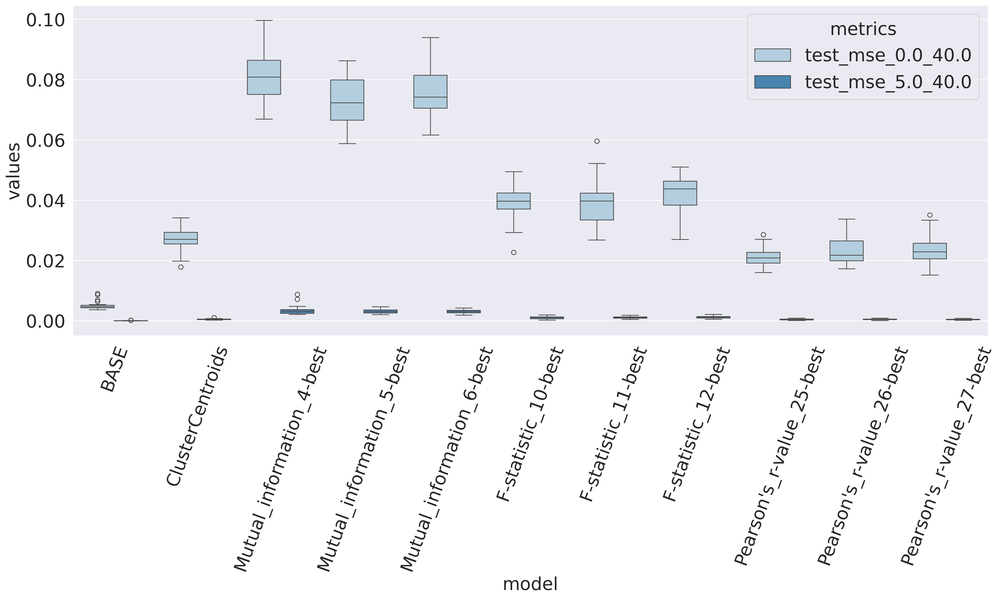

In [29]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.5_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()
shm_scoring = SHM_Scoring()

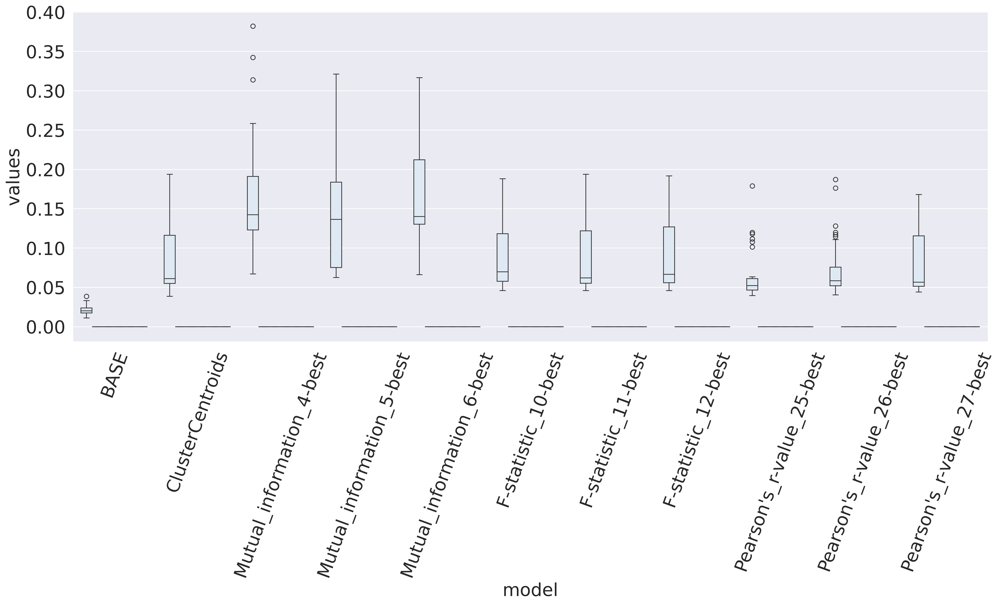

In [30]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_MSE_RESULTS))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

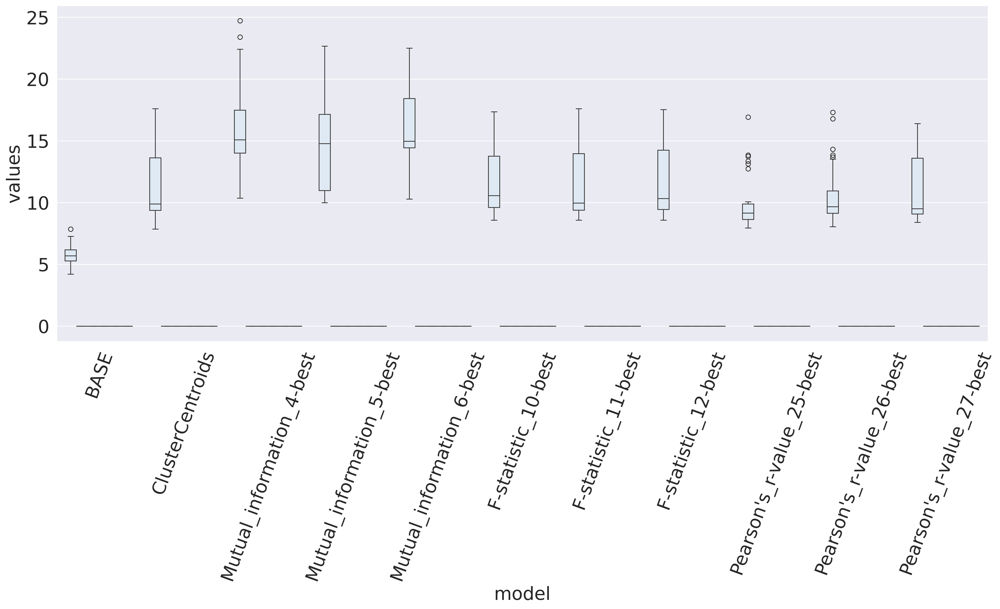

In [31]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_REL_ERROR))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

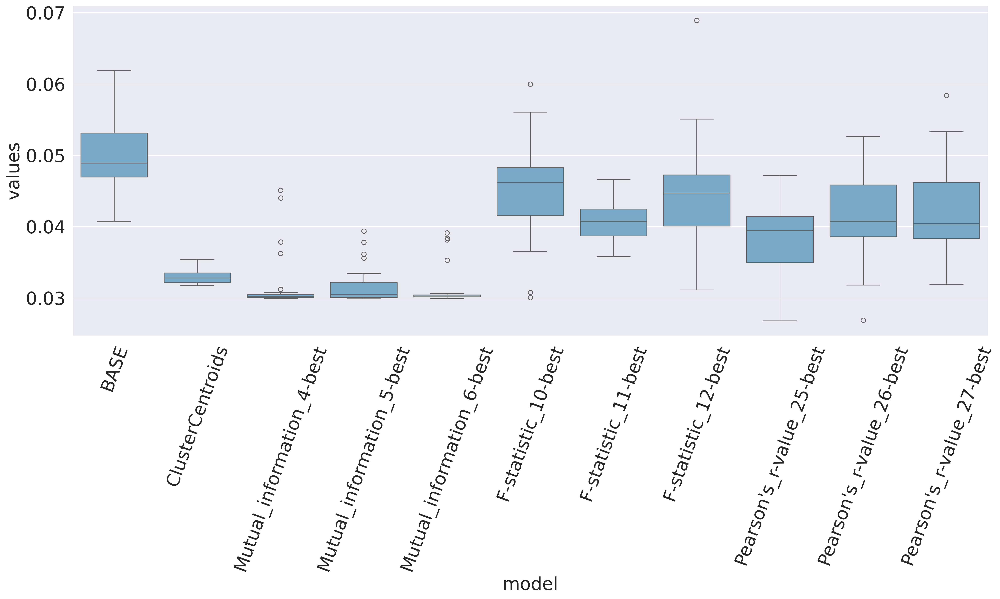

In [32]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

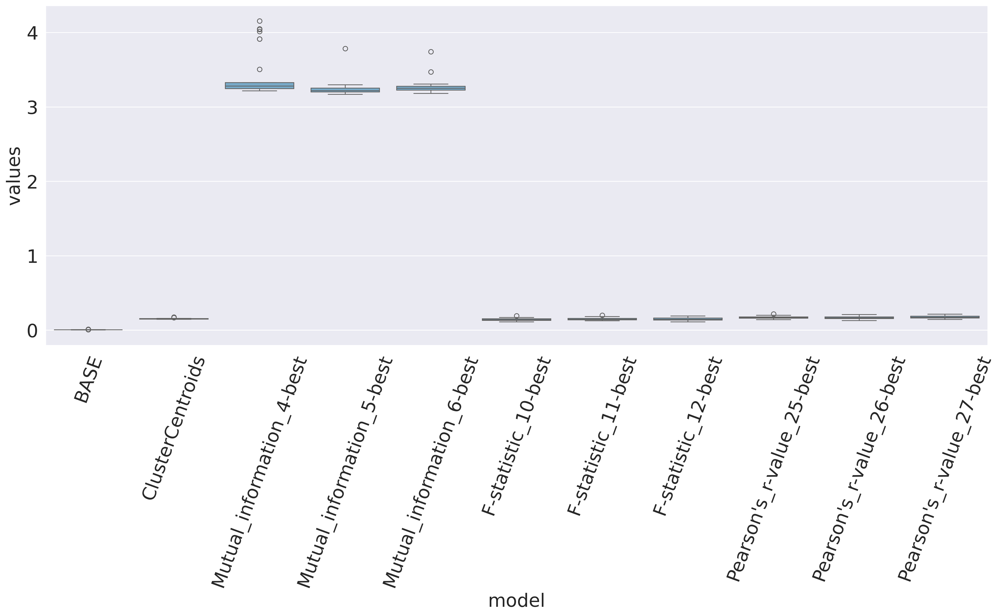

In [33]:
fig = plot_metrics(extract_metrics(results, ["fit_time"]))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

In [34]:
from plot_utils import get_metrics_summary

get_metrics_summary(extract_metrics(results, ["score_time"]))

,,mean,std
model,metrics,,
BASE,score_time,0.050216,0.005773
ClusterCentroids,score_time,0.03298,0.000942
F-statistic_10-best,score_time,0.045431,0.006989
F-statistic_11-best,score_time,0.040944,0.003017
F-statistic_12-best,score_time,0.044156,0.007625
Mutual_information_4-best,score_time,0.031574,0.003807
Mutual_information_5-best,score_time,0.031636,0.002393
Mutual_information_6-best,score_time,0.031178,0.002573
Pearson's_r-value_25-best,score_time,0.038477,0.005029


# ClusterCentroids + Feature Selection

In [35]:
result_file = "s30_synthetic_regression_AB_cc_featsel.pkl"
result_file = Path(RESULT_PATH, result_file)

In [36]:
from sklearn.preprocessing import OrdinalEncoder
from imblearn.base import FunctionSampler
from pipe_utils import resampling

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"BASE", build_pipeline())],
    [(f"ClusterCentroids", build_sampled_pipeline(sampler, estimator))],
]

m_reg = ("Mutual_information", mutual_info_regression, [4, 5, 6])
f_reg = ("F-statistic", f_regression, [12, 13, 14])
r_reg = ("Pearson's_r-value", r_regression, [25, 26, 27])

for name, scorer, npt in [
    m_reg,
    f_reg,
    r_reg,
]:
    for k in npt:
        fs = SelectKBest(score_func=scorer, k=k)

        sampler = ClusterCentroids(
            estimator=KMeans(n_init="auto"),
            sampling_strategy=strgy,
            random_state=random_state,
        )

        estimator = KNeighborsRegressor(n_neighbors=1)

        pipeline = Pipeline(
            [
                (
                    "sampler",
                    FunctionSampler(
                        func=resampling, kw_args=dict(sampler=sampler), validate=False
                    ),
                ),
                ("featsel", fs),
                ("estimator", estimator),
            ],
            verbose=False,
        )
        models.append([(f"{name}_{k}-best", pipeline)])

In [37]:
scoring = get_synth_regression_scoring()

start_time = time.perf_counter()
results = conduct_ab_reg_experiment(
    X=X,
    y=y,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)
end_time = time.perf_counter()
print(f"time passed: {end_time-start_time:.2f} s")

time passed: 31.83 s

## Store results for later

In [38]:
results.to_pickle(result_file)

## Plot some results for overview

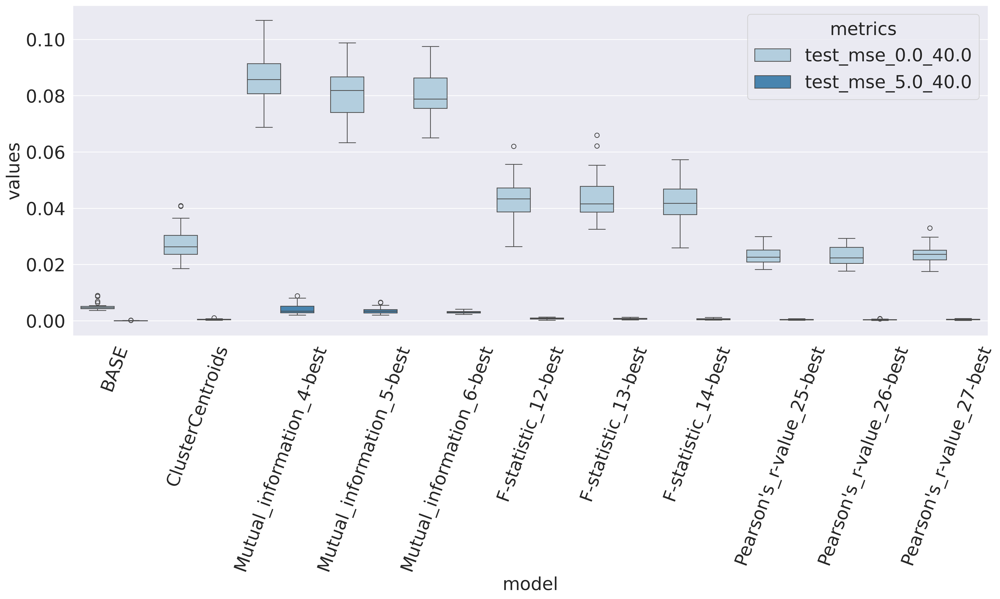

In [39]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.5_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()

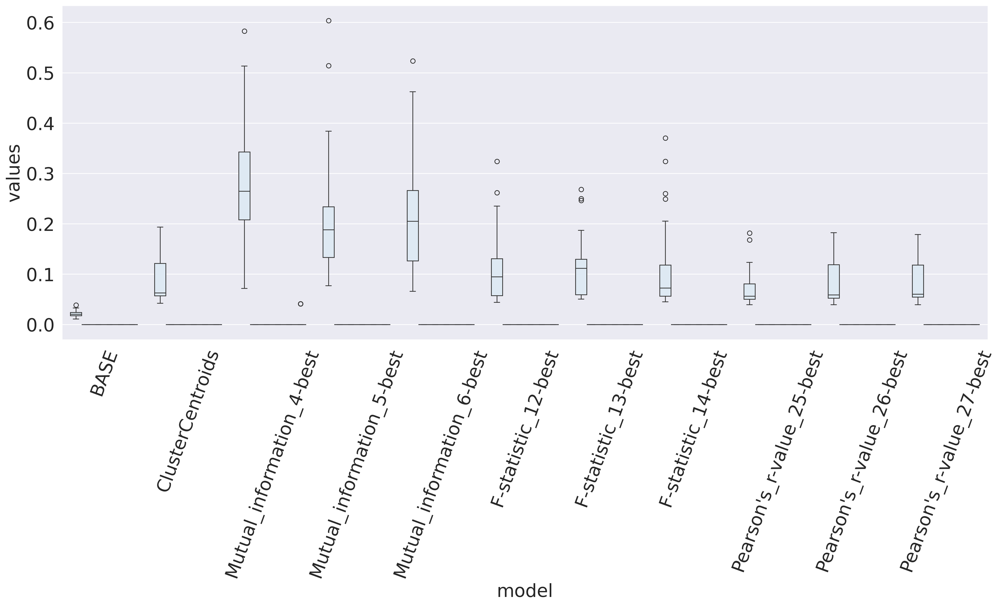

In [40]:
shm_scoring = SHM_Scoring()
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_MSE_RESULTS))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

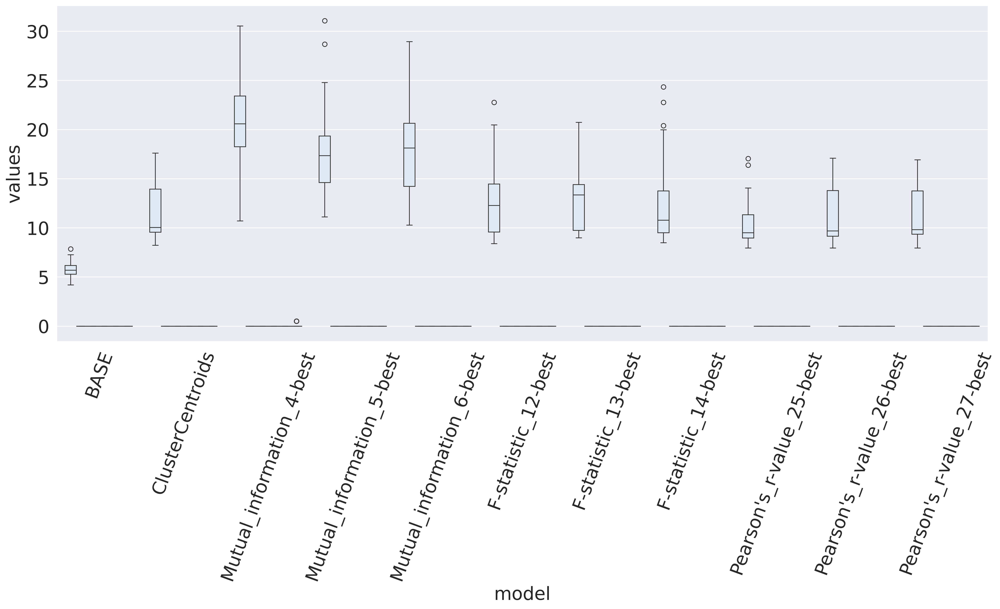

In [41]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_REL_ERROR))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

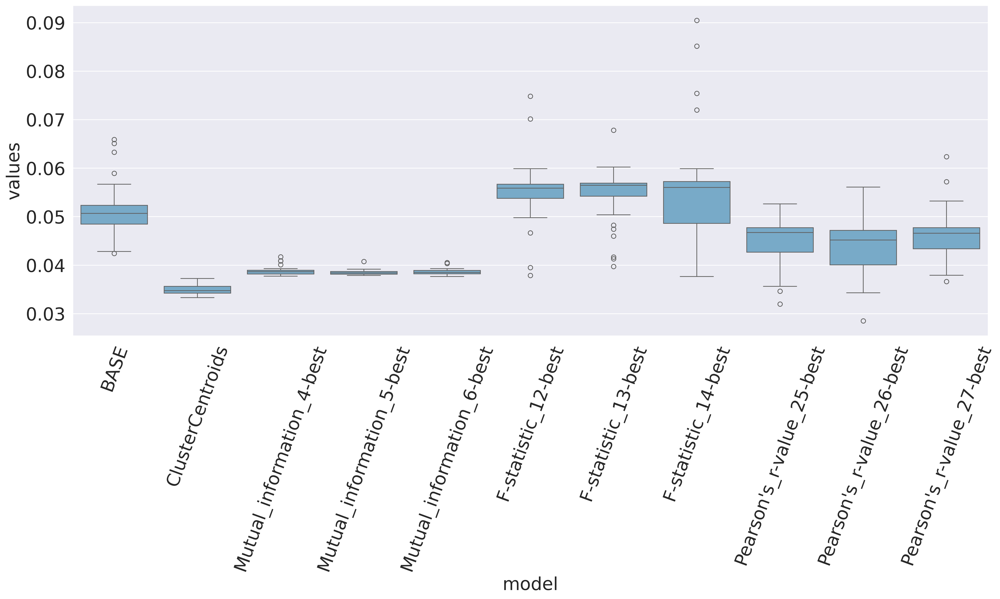

In [42]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

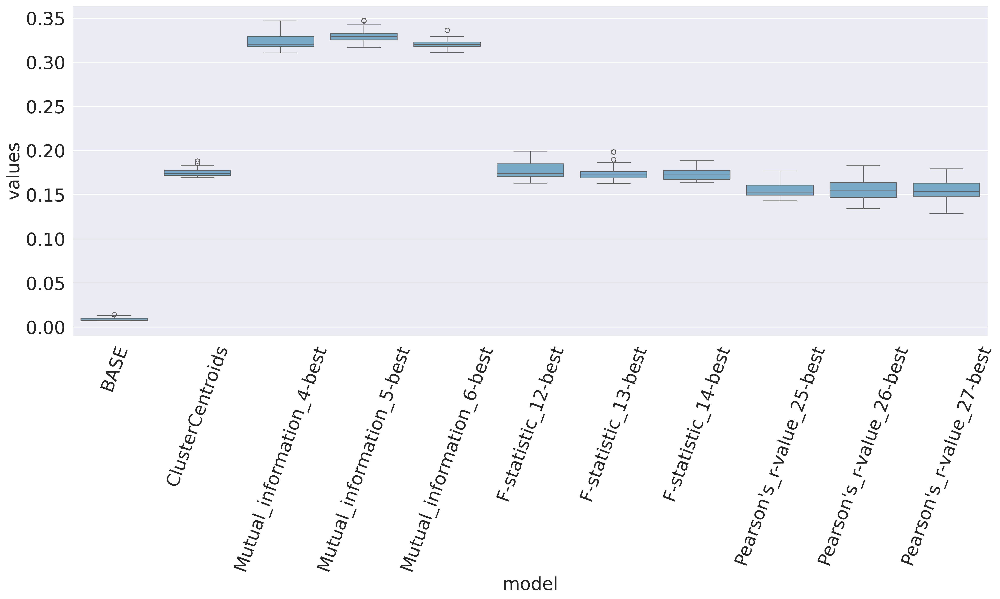

In [43]:
fig = plot_metrics(extract_metrics(results, ["fit_time"]))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

In [44]:
from plot_utils import get_metrics_summary

get_metrics_summary(extract_metrics(results, ["score_time"]))

,,mean,std
model,metrics,,
BASE,score_time,0.051267,0.005754
ClusterCentroids,score_time,0.034892,0.000980
F-statistic_12-best,score_time,0.055081,0.006657
F-statistic_13-best,score_time,0.054574,0.005937
F-statistic_14-best,score_time,0.055967,0.011351
Mutual_information_4-best,score_time,0.038811,0.000922
Mutual_information_5-best,score_time,0.038484,0.000527
Mutual_information_6-best,score_time,0.038617,0.000625
Pearson's_r-value_25-best,score_time,0.044705,0.005096
